In [1]:
import helper

data_dir = './data'# Let's download the dataset
#helper.download_celeb_a()

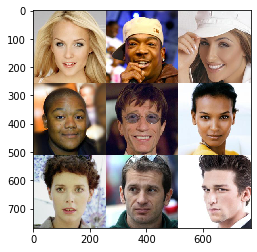

In [2]:
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot
from PIL import Image
import numpy as np
import random
# Image configuration
IMAGE_HEIGHT_HIGH = 256
IMAGE_WIDTH_HIGH = 256
data_files_high = glob(os.path.join(data_dir, 'out_highres/*.jpg'))
attrib_files=glob(os.path.join(data_dir, 'attributes/*.txt'))
shape_high = len(data_files_high), IMAGE_WIDTH_HIGH, IMAGE_HEIGHT_HIGH, 3
def get_image(image_path, width, height, mode):
    """
    Read image from image_path
    """
    image = Image.open(image_path)


    return np.array(image.convert(mode))

def get_attrib(attrib_path):
    file=open(attrib_path,"rt")
    attributes=list(map(int,file.readline().split()))
    file.close()
    return attributes

def get_batch(image_files, width, height, mode='RGB'):
    """
    Get a single image
    """
    data_batch = np.array(
        [get_image(sample_file, width, height, mode) for sample_file in image_files]).astype(np.float32)

    # Make sure the images are in 4 dimensions
    if len(data_batch.shape) < 4:
        data_batch = data_batch.reshape(data_batch.shape + (1,))

    return data_batch


def get_attrib_batch(attrib_files):
    
    
    attrib_batch=np.array(
        [get_attrib(attrib_file) for attrib_file in attrib_files]).astype(np.float32)
    
    return attrib_batch

def get_batches(batch_size):
    """
    Generate batches
    """
    IMAGE_MAX_VALUE = 255


    current_index = 0
    while current_index + batch_size <= shape_high[0]:
        data_batch_high = get_batch(
            data_files_high[current_index:current_index + batch_size],
            *shape_high[1:3])
        attrib_batch=get_attrib_batch(attrib_files[current_index:current_index + batch_size])

        current_index += batch_size

        yield data_batch_high / IMAGE_MAX_VALUE - 0.5 ,attrib_batch
        

#print(get_attrib_batch(glob(os.path.join(data_dir, 'attributes/*.txt')))[:10])
test_images_high = get_batch(glob(os.path.join(data_dir, 'out_highres/*.jpg'))[:10], 56, 56)
pyplot.imshow(helper.images_square_grid(test_images_high))
#test_images_low = get_batch(glob(os.path.join(data_dir, 'out/*.jpg'))[:10], 56, 56)
#pyplot.imshow(helper.images_square_grid(test_images_low))

In [3]:
import tensorflow as tf


from tensorflow.python.tools import inspect_checkpoint as chkp

def model_inputs(image_width_high, image_height_high,image_channels):
    """
    Create the model inputs
    """
    noise = tf.placeholder(tf.float32, (None, 100), name='input_z')
    inputs_high = tf.placeholder(tf.float32, shape=(None, image_width_high, image_height_high, image_channels), name='inputa_high') 
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    attribs=tf.placeholder(tf.float32, (None, 40), name='input_z')
    
    return attribs,noise,inputs_high, learning_rate

In [4]:
def discriminator_stage2(images, attribs,reuse=False):
    """
    Create the discriminator network
    """
    alpha = 0.2
    
    with tf.variable_scope('discriminator_stage2', reuse=reuse):
        # using 4 layer network as in DCGAN Paper
        
        # Conv 1

        
        x= tf.layers.conv2d(images, 32, 4, 2, 'SAME')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        # Conv 3
        x = tf.layers.conv2d(x, 32, 4, 2, 'SAME')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        # Conv 2
        x = tf.layers.conv2d(x, 64, 4, 2, 'SAME')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        # Conv 3
        x = tf.layers.conv2d(x, 64, 4, 1, 'SAME')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        
        
        x = tf.layers.conv2d(x, 128, 4,2, 'SAME')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        x = tf.layers.conv2d(x, 128, 4, 1, 'SAME')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        x = tf.layers.conv2d(x, 256, 4, 2, 'SAME')
        x= tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        x = tf.layers.conv2d(x, 256, 4, 1, 'SAME')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        x = tf.layers.conv2d(x, 512, 4, 2, 'SAME')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        

        # Flatten
        x = tf.reshape(x, (-1, 4*4*512))
        # Logits
        x =tf.layers.dense(x,512)
        x = tf.maximum(alpha * x, x)
        
        att=tf.layers.dense(attribs,128)
        att = tf.maximum(alpha * att, att)
        
        x=tf.concat([x,att],1)
        
        x=tf.layers.dense(x,128)
        x = tf.maximum(alpha * x, x)
        
        logits = tf.layers.dense(x, 1)
        
        # Output
        out = tf.sigmoid(logits)
        
        return out, logits

In [5]:
def generator(z,attribs, out_channel_dim, is_train=True):
    """
    Create the generator network
    """
    alpha = 0.2
    
    with tf.variable_scope('generator', reuse=False if is_train==True else True):
        # First fully connected layer
        x_1 = tf.layers.dense(attribs, 512)
        lrelu_x = tf.maximum(alpha * x_1, x_1)
        z_1=tf.layers.dense(z, 128)
        lrelu_z = tf.maximum(alpha * z_1, z_1)
        con=tf.concat([lrelu_x,lrelu_z],1)
        con_1=tf.layers.dense(con,128 * 4 * 4 * 4)
        con_relu = tf.maximum(alpha * con_1,con_1)
        
        
        
        
        # Reshape it to start the convolutional stack
        x = tf.reshape(con_relu, (-1, 4, 4, 128*4))
        # Deconv 1
        x=tf.keras.layers.UpSampling2D(size=(2, 2))(x)
        x = tf.layers.conv2d(x, 256, 5, 1, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        x = tf.layers.conv2d(x, 256, 5, 1, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        x=tf.keras.layers.UpSampling2D(size=(2, 2))(x)
        x = tf.layers.conv2d(x, 128, 5, 1, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        
        # Deconv 2
        x=tf.keras.layers.UpSampling2D(size=(2, 2))(x)
        x = tf.layers.conv2d(x,64, 5, 1, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        x=tf.keras.layers.UpSampling2D(size=(2, 2))(x)
        x = tf.layers.conv2d(x, 32, 5, 1, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        # Output layer
        logits = tf.layers.conv2d(x, out_channel_dim, 4, 1, padding='SAME')
        out = tf.tanh(logits)
        return out

In [6]:
def residual_block(inp,is_train):

    x=tf.layers.conv2d(inp,256,3,1,padding='SAME')
    x = tf.layers.batch_normalization(x, training=is_train)
    x = tf.maximum(0.2 * x, x)
    x=tf.layers.conv2d(x,256,3,1,padding='SAME')
    x = tf.layers.batch_normalization(x, training=is_train)
    x=tf.math.add(inp,x)
    x = tf.maximum(0.2 * x, x)

    return x

In [7]:
def generator_stage2(z,attribs,out_channel_dim, is_train=True):
    """
    Create the generator network
    """
    alpha = 0.2
    with tf.variable_scope('generator_stage2', reuse=False if is_train==True else True):
        at=tf.layers.dense(attribs,512)
        at = tf.maximum(alpha * at,at)
        
        at= tf.layers.dense(at,64*16*16)
        at = tf.maximum(alpha * at,at)
        
        at =tf.reshape(at,(-1,16,16,64))

        x=tf.layers.conv2d(z, 128, 4, 2, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        
        x=tf.layers.conv2d(x,256, 4, 2, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        
   
        x= tf.concat([x,at],3)
    
        x=tf.layers.conv2d(x,256, 4, 1, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
    
        x=residual_block(x,is_train)
        x=residual_block(x,is_train)
        x=residual_block(x,is_train)
        x=residual_block(x,is_train)
    
    

        
        

        x=tf.layers.conv2d_transpose(x, 128, 4, 2, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        
        

        #print(x)
        # Deconv 1
        x = tf.layers.conv2d_transpose(x, 64, 5, 2, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)

        
        x = tf.layers.conv2d_transpose(x, 32, 5, 2, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        # Deconv 2
        x = tf.layers.conv2d_transpose(x,16, 5, 2, padding='SAME')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)

        # Output layer
        
        x = tf.layers.conv2d(x, out_channel_dim, 3, 1, padding='SAME')
        x = tf.tanh(x)

        return x

In [8]:
def model_loss(input_real,attribs,noise, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    """
    
    label_smoothing = 0.9
        
    
    g_model_1 = generator(noise,attribs, out_channel_dim,False)
    g_model_2 = generator_stage2(g_model_1,attribs, out_channel_dim)
    d_model_real, d_logits_real = discriminator_stage2(input_real,attribs)
    d_model_wrong, d_logits_wrong = discriminator_stage2(input_real[:batch_size-1],attribs[1:],reuse=True)
    d_model_fake, d_logits_fake = discriminator_stage2(g_model_2,attribs, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                labels=tf.ones_like(d_model_real) * label_smoothing))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                labels=tf.zeros_like(d_model_fake)))
    d_loss_wrong = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_wrong,
                                                labels=tf.zeros_like(d_model_wrong)))
    
    d_loss = d_loss_real + d_loss_fake+d_loss_wrong
                                                  
    g_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                labels=tf.ones_like(d_model_fake) * label_smoothing))

    g_loss=g_loss_fake
    
    
    return d_loss,d_loss_real,d_loss_fake,d_loss_wrong, g_loss

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator_stage2')]
    g_vars = [var for var in t_vars if var.name.startswith('generator_stage2')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)): 
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

In [10]:
def show_generator_output(sess, n_images,input_z,attribs, batch_images_high,batch_attribs,out_channel_dim,batch_size):
    """
    Show example output for the generator
    """
    f=open("/Studies/GANs/dcgan-oreilly/data/CelebAMask-HQ-attribute-anno.txt","rt")
    no_of_images=int(f.readline())
    attribute_names=list(f.readline().split())
    names=[]
    rand_no=random.randint(0,batch_size-1)
    example_attribs=batch_attribs[rand_no]
    example_img_high=batch_images_high[rand_no]
    example_attribs=np.reshape(example_attribs,(1,40))
    example_img_high=np.reshape(example_img_high,(1,256,256,3))
    for n in range(40):
        if example_attribs[0,n]==1:
            names.append(attribute_names[n])

    
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])
    example_z= example_z.astype('float32')
    images_low=generator(input_z,attribs,out_channel_dim, False)
    samples_high = sess.run(
        generator_stage2(images_low,attribs,out_channel_dim, False),
        feed_dict={attribs:example_attribs,input_z: example_z})
    
    print(names)
    #pyplot.imshow(helper.images_square_grid(example_img_high))
    #pyplot.show()
    pyplot.imshow(helper.images_square_grid(samples_high))
    pyplot.show()

In [11]:
def train(epoch_count, batch_size, learning_rate, beta1, get_batches, data_shape_high,z_dim):
    """
    Train the GAN
    """
    v1=tf.get_variable("generator/dense/kernel", (40,512))
    v2=tf.get_variable("generator/dense/bias", (512,))
    v3=tf.get_variable("generator/dense_1/kernel", (100,128))
    v4=tf.get_variable("generator/dense_1/bias", (128,))
    v5=tf.get_variable("generator/dense_2/kernel", (640,8192))
    v6=tf.get_variable("generator/dense_2/bias", (8192,))
    v7=tf.get_variable("generator/conv2d/kernel", (5, 5, 512, 256))
    v8=tf.get_variable("generator/conv2d/bias", (256,))
    v9=tf.get_variable("generator/batch_normalization/gamma", (256,))
    v10=tf.get_variable("generator/batch_normalization/beta", (256,))
    v9_1=tf.get_variable("generator/batch_normalization/moving_mean",(256,))
    v9_2=tf.get_variable("generator/batch_normalization/moving_variance",(256,))
    v11=tf.get_variable("generator/conv2d_1/kernel", (5, 5, 256, 256))
    v12=tf.get_variable("generator/conv2d_1/bias", (256,))
    v13=tf.get_variable("generator/batch_normalization_1/gamma", (256,))
    v14=tf.get_variable("generator/batch_normalization_1/beta", (256,))
    v14_1=tf.get_variable("generator/batch_normalization_1/moving_mean",(256,))
    v14_2=tf.get_variable("generator/batch_normalization_1/moving_variance",(256,))
    v15=tf.get_variable("generator/conv2d_2/kernel", (5, 5, 256, 128))
    v16=tf.get_variable("generator/conv2d_2/bias", (128,))
    v17=tf.get_variable("generator/batch_normalization_2/gamma", (128,))
    v18=tf.get_variable("generator/batch_normalization_2/beta", (128,))
    v18_1=tf.get_variable("generator/batch_normalization_2/moving_mean",(128,))
    v18_2=tf.get_variable("generator/batch_normalization_2/moving_variance",(128,))
    v19=tf.get_variable("generator/conv2d_3/kernel", (5, 5, 128, 64))
    v20=tf.get_variable("generator/conv2d_3/bias", (64,))
    v21=tf.get_variable("generator/batch_normalization_3/gamma", (64,))
    v22=tf.get_variable("generator/batch_normalization_3/beta", (64,))
    v22_1=tf.get_variable("generator/batch_normalization_3/moving_mean",(64,))
    v22_2=tf.get_variable("generator/batch_normalization_3/moving_variance",(64,))
    v23=tf.get_variable("generator/conv2d_4/kernel", (5, 5, 64, 32))
    v24=tf.get_variable("generator/conv2d_4/bias", (32,))
    v25=tf.get_variable("generator/batch_normalization_4/gamma", (32,))
    v26=tf.get_variable("generator/batch_normalization_4/beta", (32,))
    v26_1=tf.get_variable("generator/batch_normalization_4/moving_mean",(32,))
    v26_2=tf.get_variable("generator/batch_normalization_4/moving_variance",(32,))
    v27=tf.get_variable("generator/conv2d_5/kernel", (4, 4, 32, 3))
    v28=tf.get_variable("generator/conv2d_5/bias", (3,))
    saver_64 = tf.train.Saver()
    attribs,noise,input_high, _ = model_inputs(data_shape_high[1], data_shape_high[2],data_shape_high[3])
    d_loss,d_loss_real,d_loss_fake,d_loss_wrong, g_loss = model_loss(input_high, attribs, noise,data_shape_high[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    saver = tf.train.Saver()
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    steps = 0
    with tf.Session(config=config) as sess:
        
        sess.run(tf.global_variables_initializer())
        saver_64.restore(sess, "/save_64/model.ckpt")
        for epoch_i in range(epoch_count):
            for batch_images_high,batch_attribs in get_batches(batch_size):
                
                # values range from -0.5 to 0.5, therefore scale to range -1, 1
                batch_images_high = batch_images_high * 2
                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_opt, feed_dict={input_high: batch_images_high,noise:batch_z,attribs:batch_attribs})
                _ = sess.run(g_opt, feed_dict={input_high: batch_images_high,noise:batch_z,attribs:batch_attribs})
                
                if steps % 400== 0:
                    # At the end of every 10 epochs, get the losses and print them out
                    train_loss_d = d_loss.eval({input_high: batch_images_high,noise:batch_z,attribs:batch_attribs})
                    train_loss_d_fake = d_loss_fake.eval({input_high: batch_images_high,noise:batch_z,attribs:batch_attribs})
                    train_loss_d_real = d_loss_real.eval({input_high: batch_images_high,noise:batch_z,attribs:batch_attribs})
                    train_loss_d_wrong = d_loss_wrong.eval({input_high: batch_images_high,noise:batch_z,attribs:batch_attribs})
                    train_loss_g = g_loss.eval({input_high: batch_images_high,noise:batch_z,attribs:batch_attribs})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Discriminator Loss(real): {:.4f}...".format(train_loss_d_real),
                          "Discriminator Loss(fake): {:.4f}...".format(train_loss_d_fake),
                          "Discriminator Loss(wrong): {:.4f}...".format(train_loss_d_wrong),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    _ = show_generator_output(sess, 1, noise,attribs, batch_images_high,batch_attribs,data_shape_high[3],batch_size)
            save_path = saver.save(sess, "/save_256_new/model.ckpt")
            print("Model saved in path: %s" % save_path)
        

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Use keras.layers.conv2d instead.
Instructions for updating:
Use keras.layers.batch_normalization instead.
Instructions for updating:
Use keras.layers.conv2d_transpose instead.
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from /save_64/model.ckpt
Epoch 1/100... Discriminator Loss: 1.3358... Discriminator Loss(real): 0.6836... Discriminator Loss(fake): 0.0093... Discriminator Loss(wrong): 0.6429... Generator Loss: 4.3534
['Bags_Under_Eyes', 'Big_Nose', 'Black_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Wearing_Necktie']


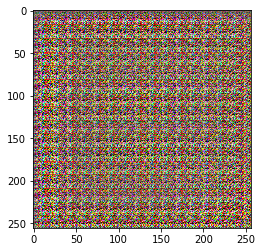

Epoch 1/100... Discriminator Loss: 1.7715... Discriminator Loss(real): 1.5006... Discriminator Loss(fake): 0.0783... Discriminator Loss(wrong): 0.1926... Generator Loss: 2.4936
['Black_Hair', 'Brown_Hair', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Young']


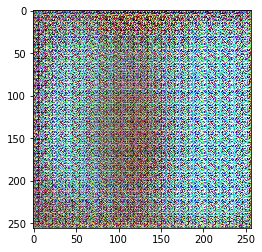

Epoch 1/100... Discriminator Loss: 1.5136... Discriminator Loss(real): 0.9106... Discriminator Loss(fake): 0.1941... Discriminator Loss(wrong): 0.4089... Generator Loss: 1.7395
['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Brown_Hair', 'Heavy_Makeup', 'No_Beard', 'Pale_Skin', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


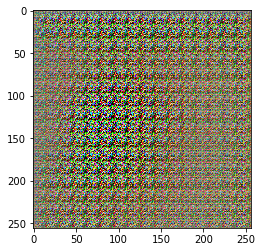

Epoch 1/100... Discriminator Loss: 1.2730... Discriminator Loss(real): 0.8003... Discriminator Loss(fake): 0.0276... Discriminator Loss(wrong): 0.4451... Generator Loss: 3.3434
['Attractive', 'Mouth_Slightly_Open', 'No_Beard', 'Straight_Hair', 'Wearing_Lipstick', 'Young']


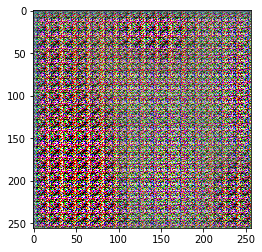

Model saved in path: /save_256_new/model.ckpt
Epoch 2/100... Discriminator Loss: 1.0364... Discriminator Loss(real): 0.6099... Discriminator Loss(fake): 0.0000... Discriminator Loss(wrong): 0.4265... Generator Loss: 9.1853
['Bags_Under_Eyes', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Chubby', 'Double_Chin', 'Goatee', 'High_Cheekbones', 'Male', 'Mustache', 'Sideburns', 'Smiling']


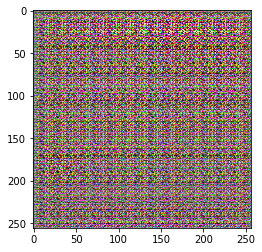

Epoch 2/100... Discriminator Loss: 1.0071... Discriminator Loss(real): 0.6741... Discriminator Loss(fake): 0.0000... Discriminator Loss(wrong): 0.3331... Generator Loss: 10.6742
['Attractive', 'Big_Lips', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'No_Beard', 'Pointy_Nose', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


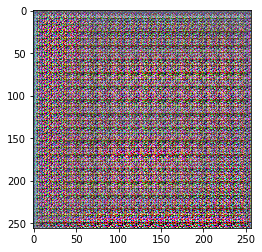

Epoch 2/100... Discriminator Loss: 1.3017... Discriminator Loss(real): 0.7669... Discriminator Loss(fake): 0.3030... Discriminator Loss(wrong): 0.2318... Generator Loss: 1.3165
['Attractive', 'Bags_Under_Eyes', 'Big_Nose', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Pointy_Nose', 'Receding_Hairline', 'Smiling', 'Straight_Hair', 'Wearing_Necktie']


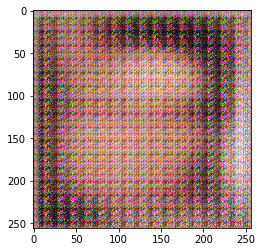

Epoch 2/100... Discriminator Loss: 1.4501... Discriminator Loss(real): 1.0016... Discriminator Loss(fake): 0.2404... Discriminator Loss(wrong): 0.2081... Generator Loss: 1.5175
['5_o_Clock_Shadow', 'Big_Lips', 'Eyeglasses', 'Male', 'Wavy_Hair', 'Young']


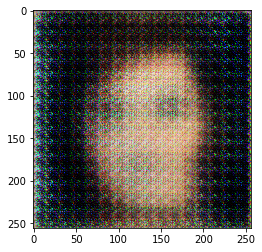

Epoch 2/100... Discriminator Loss: 1.4961... Discriminator Loss(real): 0.7173... Discriminator Loss(fake): 0.3667... Discriminator Loss(wrong): 0.4121... Generator Loss: 1.1850
['Attractive', 'Heavy_Makeup', 'No_Beard', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


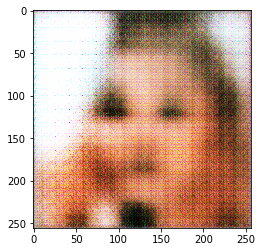

Model saved in path: /save_256_new/model.ckpt
Epoch 3/100... Discriminator Loss: 1.3042... Discriminator Loss(real): 0.8201... Discriminator Loss(fake): 0.1787... Discriminator Loss(wrong): 0.3054... Generator Loss: 1.6767
['Black_Hair', 'High_Cheekbones', 'No_Beard', 'Oval_Face', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick']


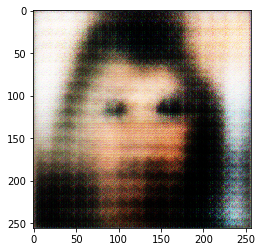

Epoch 3/100... Discriminator Loss: 1.2625... Discriminator Loss(real): 0.5037... Discriminator Loss(fake): 0.4700... Discriminator Loss(wrong): 0.2888... Generator Loss: 0.9978
['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Blond_Hair', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'No_Beard', 'Pointy_Nose', 'Wearing_Lipstick', 'Young']


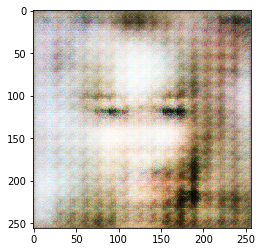

Epoch 3/100... Discriminator Loss: 1.3630... Discriminator Loss(real): 0.4512... Discriminator Loss(fake): 0.4900... Discriminator Loss(wrong): 0.4218... Generator Loss: 1.0483
['Attractive', 'Black_Hair', 'Bushy_Eyebrows', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Smiling', 'Straight_Hair', 'Wearing_Lipstick', 'Young']


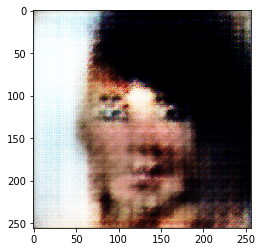

Epoch 3/100... Discriminator Loss: 1.3107... Discriminator Loss(real): 0.7672... Discriminator Loss(fake): 0.3102... Discriminator Loss(wrong): 0.2333... Generator Loss: 1.2770
['Attractive', 'Bangs', 'Big_Lips', 'Blond_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Pointy_Nose', 'Smiling', 'Straight_Hair', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


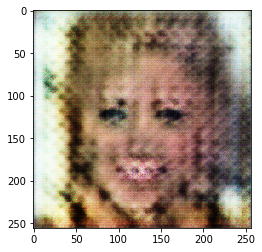

Epoch 3/100... Discriminator Loss: 1.4842... Discriminator Loss(real): 0.7372... Discriminator Loss(fake): 0.3996... Discriminator Loss(wrong): 0.3474... Generator Loss: 1.1074
['Attractive', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'No_Beard', 'Pointy_Nose', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


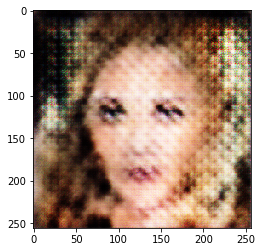

Model saved in path: /save_256_new/model.ckpt
Epoch 4/100... Discriminator Loss: 1.1333... Discriminator Loss(real): 0.6130... Discriminator Loss(fake): 0.3263... Discriminator Loss(wrong): 0.1940... Generator Loss: 1.2810
['Big_Nose', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Gray_Hair', 'Male', 'No_Beard', 'Wearing_Necktie']


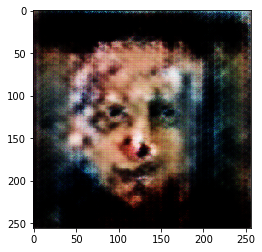

Epoch 4/100... Discriminator Loss: 1.0910... Discriminator Loss(real): 0.6680... Discriminator Loss(fake): 0.2350... Discriminator Loss(wrong): 0.1880... Generator Loss: 1.6401
['Arched_Eyebrows', 'Attractive', 'Bangs', 'Big_Lips', 'Brown_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Pointy_Nose', 'Rosy_Cheeks', 'Smiling', 'Straight_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


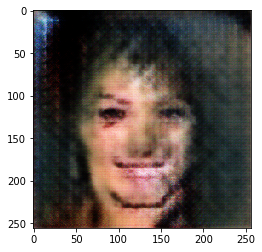

Epoch 4/100... Discriminator Loss: 1.2727... Discriminator Loss(real): 0.4655... Discriminator Loss(fake): 0.4570... Discriminator Loss(wrong): 0.3502... Generator Loss: 1.0351
['Arched_Eyebrows', 'Attractive', 'Blond_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Oval_Face', 'Smiling', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


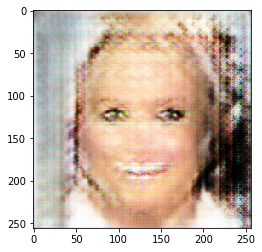

Epoch 4/100... Discriminator Loss: 1.1937... Discriminator Loss(real): 0.6967... Discriminator Loss(fake): 0.3232... Discriminator Loss(wrong): 0.1739... Generator Loss: 1.2446
['Attractive', 'Big_Lips', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Smiling', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


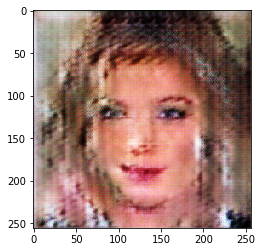

Model saved in path: /save_256_new/model.ckpt
Epoch 5/100... Discriminator Loss: 1.2508... Discriminator Loss(real): 0.7774... Discriminator Loss(fake): 0.2738... Discriminator Loss(wrong): 0.1996... Generator Loss: 1.4091
['Attractive', 'Black_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Receding_Hairline', 'Smiling', 'Wearing_Lipstick', 'Young']


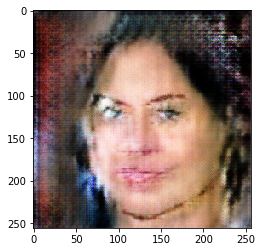

Epoch 5/100... Discriminator Loss: 1.3316... Discriminator Loss(real): 0.9731... Discriminator Loss(fake): 0.2001... Discriminator Loss(wrong): 0.1584... Generator Loss: 1.6849
['Bags_Under_Eyes', 'Bald', 'Big_Nose', 'Double_Chin', 'Goatee', 'Male', 'Mustache', 'Narrow_Eyes', 'Wearing_Necktie']


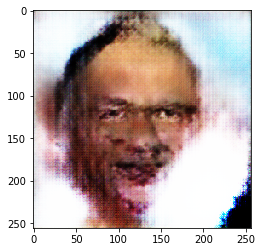

Epoch 5/100... Discriminator Loss: 1.1272... Discriminator Loss(real): 0.5544... Discriminator Loss(fake): 0.4417... Discriminator Loss(wrong): 0.1311... Generator Loss: 1.0452
['Bangs', 'Big_Lips', 'Brown_Hair', 'Bushy_Eyebrows', 'No_Beard', 'Oval_Face', 'Wavy_Hair', 'Young']


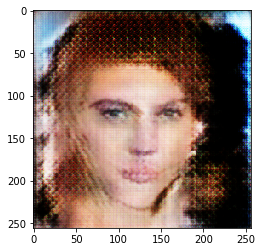

Epoch 5/100... Discriminator Loss: 0.9818... Discriminator Loss(real): 0.6427... Discriminator Loss(fake): 0.2133... Discriminator Loss(wrong): 0.1258... Generator Loss: 1.6171
['Bald', 'Big_Nose', 'Chubby', 'Double_Chin', 'Gray_Hair', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'Receding_Hairline', 'Smiling', 'Straight_Hair', 'Wearing_Necktie']


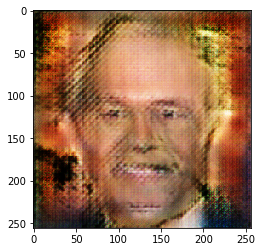

Epoch 5/100... Discriminator Loss: 1.1747... Discriminator Loss(real): 0.6370... Discriminator Loss(fake): 0.3282... Discriminator Loss(wrong): 0.2095... Generator Loss: 1.2357
['Big_Lips', 'Male', 'Narrow_Eyes', 'No_Beard', 'Smiling', 'Straight_Hair', 'Wearing_Necktie', 'Young']


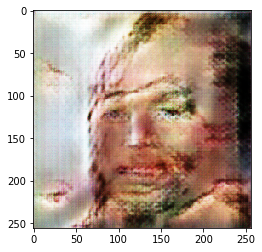

Model saved in path: /save_256_new/model.ckpt
Epoch 6/100... Discriminator Loss: 1.0179... Discriminator Loss(real): 0.5097... Discriminator Loss(fake): 0.3638... Discriminator Loss(wrong): 0.1444... Generator Loss: 1.1687
['Arched_Eyebrows', 'Bags_Under_Eyes', 'Big_Nose', 'Bushy_Eyebrows', 'Double_Chin', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Receding_Hairline', 'Smiling']


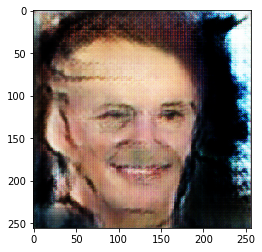

Epoch 6/100... Discriminator Loss: 0.9438... Discriminator Loss(real): 0.5877... Discriminator Loss(fake): 0.2614... Discriminator Loss(wrong): 0.0947... Generator Loss: 1.4261
['Arched_Eyebrows', 'Bags_Under_Eyes', 'Big_Lips', 'Big_Nose', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Receding_Hairline', 'Smiling', 'Young']


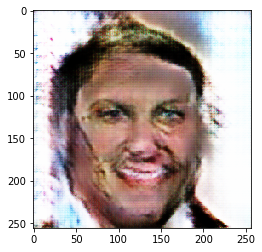

Epoch 6/100... Discriminator Loss: 1.1707... Discriminator Loss(real): 0.6323... Discriminator Loss(fake): 0.3591... Discriminator Loss(wrong): 0.1792... Generator Loss: 1.2057
['Arched_Eyebrows', 'Attractive', 'Big_Nose', 'Brown_Hair', 'Bushy_Eyebrows', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Smiling', 'Young']


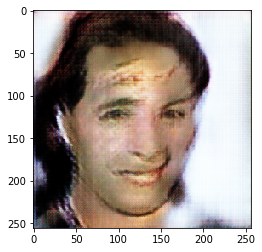

Epoch 6/100... Discriminator Loss: 0.9740... Discriminator Loss(real): 0.5408... Discriminator Loss(fake): 0.3371... Discriminator Loss(wrong): 0.0960... Generator Loss: 1.2134
['Bangs', 'Big_Lips', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


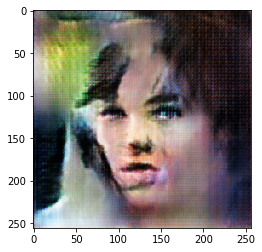

Epoch 6/100... Discriminator Loss: 1.2530... Discriminator Loss(real): 0.4309... Discriminator Loss(fake): 0.5543... Discriminator Loss(wrong): 0.2677... Generator Loss: 0.8937
['Attractive', 'Bangs', 'Big_Nose', 'Black_Hair', 'Heavy_Makeup', 'No_Beard', 'Wearing_Earrings', 'Wearing_Lipstick']


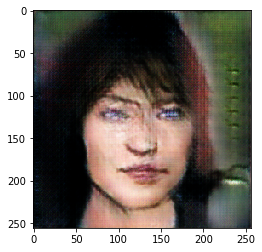

Model saved in path: /save_256_new/model.ckpt
Epoch 7/100... Discriminator Loss: 1.0020... Discriminator Loss(real): 0.4397... Discriminator Loss(fake): 0.4558... Discriminator Loss(wrong): 0.1066... Generator Loss: 1.1531
['Bags_Under_Eyes', 'Big_Nose', 'Goatee', 'Gray_Hair', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache']


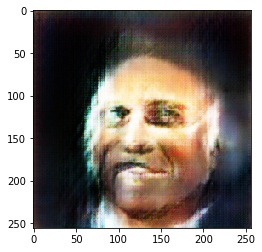

Epoch 7/100... Discriminator Loss: 1.1521... Discriminator Loss(real): 0.5025... Discriminator Loss(fake): 0.5065... Discriminator Loss(wrong): 0.1431... Generator Loss: 0.9547
['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Heavy_Makeup', 'No_Beard', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


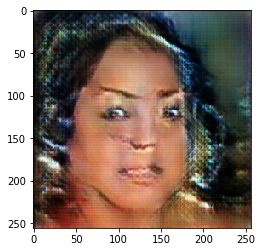

Epoch 7/100... Discriminator Loss: 1.0300... Discriminator Loss(real): 0.6193... Discriminator Loss(fake): 0.2779... Discriminator Loss(wrong): 0.1327... Generator Loss: 1.6534
['5_o_Clock_Shadow', 'Attractive', 'Black_Hair', 'Eyeglasses', 'Goatee', 'Male', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Young']


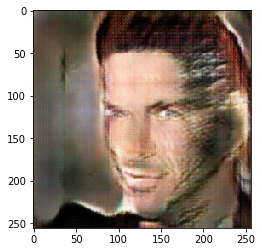

Epoch 7/100... Discriminator Loss: 1.1062... Discriminator Loss(real): 0.6350... Discriminator Loss(fake): 0.3321... Discriminator Loss(wrong): 0.1391... Generator Loss: 1.2340
['Attractive', 'Bangs', 'Big_Lips', 'Blond_Hair', 'High_Cheekbones', 'No_Beard', 'Straight_Hair', 'Wearing_Lipstick', 'Wearing_Necklace']


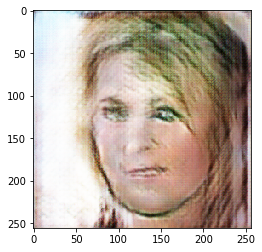

Model saved in path: /save_256_new/model.ckpt
Epoch 8/100... Discriminator Loss: 1.1272... Discriminator Loss(real): 0.5361... Discriminator Loss(fake): 0.4299... Discriminator Loss(wrong): 0.1612... Generator Loss: 1.0611
['Attractive', 'Big_Lips', 'Brown_Hair', 'No_Beard', 'Oval_Face', 'Pointy_Nose', 'Wearing_Lipstick', 'Young']


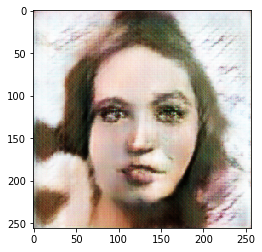

Epoch 8/100... Discriminator Loss: 0.9871... Discriminator Loss(real): 0.6127... Discriminator Loss(fake): 0.2521... Discriminator Loss(wrong): 0.1223... Generator Loss: 1.5530
['Arched_Eyebrows', 'Attractive', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Pointy_Nose', 'Rosy_Cheeks', 'Smiling', 'Straight_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


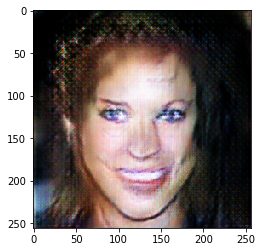

Epoch 8/100... Discriminator Loss: 0.9202... Discriminator Loss(real): 0.5540... Discriminator Loss(fake): 0.2395... Discriminator Loss(wrong): 0.1268... Generator Loss: 1.5539
['Arched_Eyebrows', 'Attractive', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'No_Beard', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


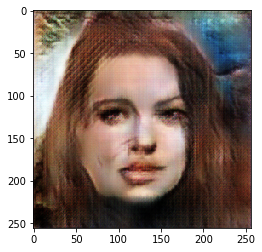

Epoch 8/100... Discriminator Loss: 0.8299... Discriminator Loss(real): 0.5041... Discriminator Loss(fake): 0.2377... Discriminator Loss(wrong): 0.0881... Generator Loss: 1.5651
['Attractive', 'Bushy_Eyebrows', 'No_Beard', 'Young']


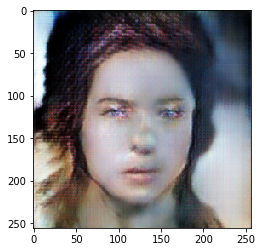

Epoch 8/100... Discriminator Loss: 0.9666... Discriminator Loss(real): 0.6883... Discriminator Loss(fake): 0.1685... Discriminator Loss(wrong): 0.1098... Generator Loss: 2.0040
['Arched_Eyebrows', 'Big_Lips', 'Blond_Hair', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Pale_Skin', 'Wearing_Lipstick', 'Young']


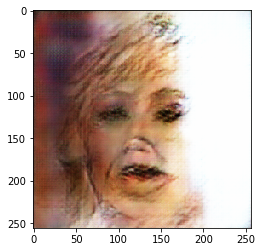

Model saved in path: /save_256_new/model.ckpt
Epoch 9/100... Discriminator Loss: 1.0536... Discriminator Loss(real): 0.5239... Discriminator Loss(fake): 0.4633... Discriminator Loss(wrong): 0.0664... Generator Loss: 1.0113
['Attractive', 'Heavy_Makeup', 'No_Beard', 'Pointy_Nose', 'Straight_Hair', 'Wearing_Lipstick', 'Young']


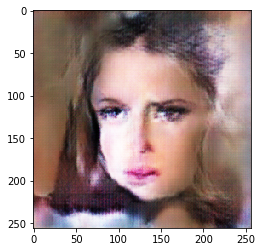

Epoch 9/100... Discriminator Loss: 0.8840... Discriminator Loss(real): 0.6518... Discriminator Loss(fake): 0.1968... Discriminator Loss(wrong): 0.0355... Generator Loss: 1.7015
['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Blond_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Pointy_Nose', 'Rosy_Cheeks', 'Smiling', 'Wavy_Hair', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


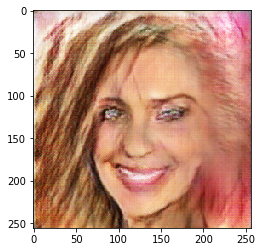

Epoch 9/100... Discriminator Loss: 0.8650... Discriminator Loss(real): 0.5705... Discriminator Loss(fake): 0.1898... Discriminator Loss(wrong): 0.1047... Generator Loss: 1.7398
['Bags_Under_Eyes', 'Big_Nose', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Gray_Hair', 'High_Cheekbones', 'Male', 'Mustache', 'Wavy_Hair']


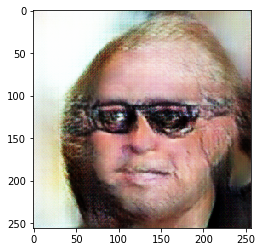

Epoch 9/100... Discriminator Loss: 0.9982... Discriminator Loss(real): 0.4826... Discriminator Loss(fake): 0.4587... Discriminator Loss(wrong): 0.0568... Generator Loss: 1.0938
['Arched_Eyebrows', 'Blond_Hair', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'No_Beard', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


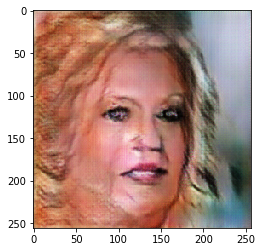

Epoch 9/100... Discriminator Loss: 2.1757... Discriminator Loss(real): 0.3893... Discriminator Loss(fake): 1.4612... Discriminator Loss(wrong): 0.3252... Generator Loss: 0.4865
['5_o_Clock_Shadow', 'Attractive', 'Big_Nose', 'Bushy_Eyebrows', 'Male', 'Mustache', 'Sideburns', 'Young']


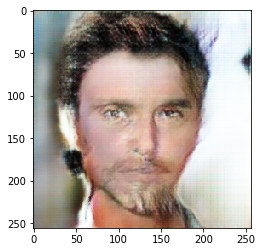

Model saved in path: /save_256_new/model.ckpt
Epoch 10/100... Discriminator Loss: 0.8779... Discriminator Loss(real): 0.5461... Discriminator Loss(fake): 0.1976... Discriminator Loss(wrong): 0.1342... Generator Loss: 1.6747
['Bags_Under_Eyes', 'Big_Nose', 'Eyeglasses', 'Gray_Hair', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Receding_Hairline', 'Smiling']


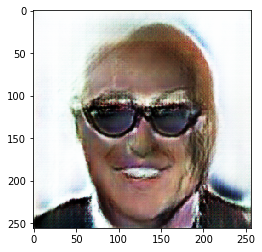

Epoch 10/100... Discriminator Loss: 0.8746... Discriminator Loss(real): 0.4999... Discriminator Loss(fake): 0.3071... Discriminator Loss(wrong): 0.0677... Generator Loss: 1.3628
['Arched_Eyebrows', 'Attractive', 'No_Beard', 'Receding_Hairline', 'Straight_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


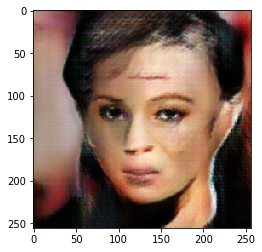

Epoch 10/100... Discriminator Loss: 1.3155... Discriminator Loss(real): 0.3611... Discriminator Loss(fake): 0.8845... Discriminator Loss(wrong): 0.0699... Generator Loss: 0.6991
['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Bushy_Eyebrows', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Pointy_Nose', 'Smiling', 'Straight_Hair', 'Wearing_Lipstick', 'Young']


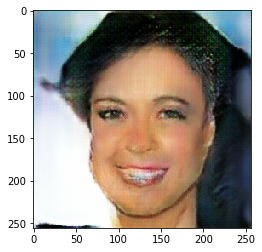

Epoch 10/100... Discriminator Loss: 0.8970... Discriminator Loss(real): 0.4478... Discriminator Loss(fake): 0.3617... Discriminator Loss(wrong): 0.0875... Generator Loss: 1.2028
['Attractive', 'Brown_Hair', 'No_Beard', 'Wavy_Hair']


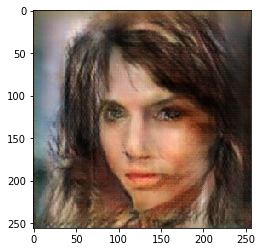

Model saved in path: /save_256_new/model.ckpt
Epoch 11/100... Discriminator Loss: 0.8515... Discriminator Loss(real): 0.6747... Discriminator Loss(fake): 0.1321... Discriminator Loss(wrong): 0.0447... Generator Loss: 2.0109
['Arched_Eyebrows', 'Attractive', 'Heavy_Makeup', 'No_Beard', 'Pale_Skin', 'Pointy_Nose', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


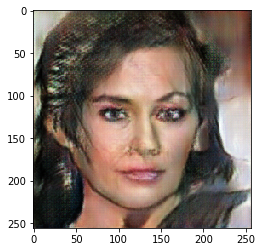

Epoch 11/100... Discriminator Loss: 0.8436... Discriminator Loss(real): 0.4778... Discriminator Loss(fake): 0.3123... Discriminator Loss(wrong): 0.0535... Generator Loss: 1.3194
['Attractive', 'Brown_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Oval_Face', 'Smiling', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


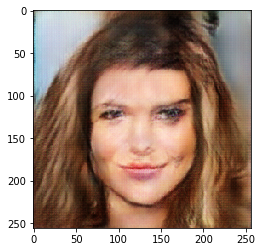

Epoch 11/100... Discriminator Loss: 1.5268... Discriminator Loss(real): 0.4615... Discriminator Loss(fake): 0.6252... Discriminator Loss(wrong): 0.4401... Generator Loss: 0.9949
['Arched_Eyebrows', 'Bags_Under_Eyes', 'Blond_Hair', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Pointy_Nose', 'Smiling', 'Wearing_Earrings', 'Wearing_Lipstick', 'Wearing_Necklace']


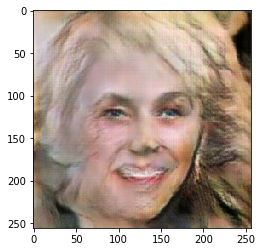

Epoch 11/100... Discriminator Loss: 0.7724... Discriminator Loss(real): 0.4091... Discriminator Loss(fake): 0.3100... Discriminator Loss(wrong): 0.0533... Generator Loss: 1.3389
['Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Big_Nose', 'Black_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Narrow_Eyes', 'No_Beard', 'Smiling', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


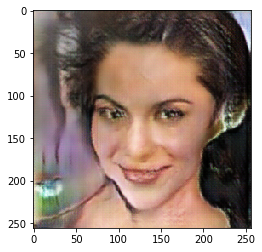

Epoch 11/100... Discriminator Loss: 0.7423... Discriminator Loss(real): 0.4333... Discriminator Loss(fake): 0.2426... Discriminator Loss(wrong): 0.0664... Generator Loss: 1.6088
['Attractive', 'Blond_Hair', 'Heavy_Makeup', 'No_Beard', 'Pointy_Nose', 'Straight_Hair', 'Wearing_Lipstick', 'Young']


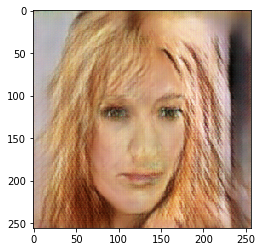

Model saved in path: /save_256_new/model.ckpt
Epoch 12/100... Discriminator Loss: 0.6818... Discriminator Loss(real): 0.4469... Discriminator Loss(fake): 0.1968... Discriminator Loss(wrong): 0.0381... Generator Loss: 1.7775
['Bags_Under_Eyes', 'Big_Nose', 'Black_Hair', 'Eyeglasses', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Straight_Hair']


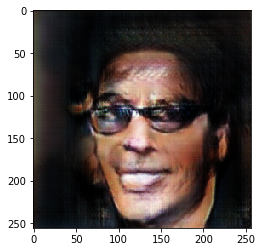

Epoch 12/100... Discriminator Loss: 0.7443... Discriminator Loss(real): 0.3813... Discriminator Loss(fake): 0.2782... Discriminator Loss(wrong): 0.0849... Generator Loss: 1.4579
['Black_Hair', 'High_Cheekbones', 'No_Beard', 'Smiling', 'Straight_Hair', 'Wearing_Lipstick', 'Young']


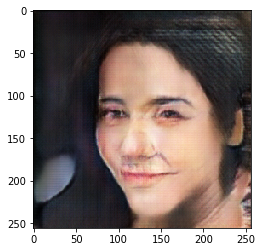

Epoch 12/100... Discriminator Loss: 0.7686... Discriminator Loss(real): 0.4498... Discriminator Loss(fake): 0.2700... Discriminator Loss(wrong): 0.0488... Generator Loss: 1.5429
['5_o_Clock_Shadow', 'Bags_Under_Eyes', 'Bangs', 'Black_Hair', 'Bushy_Eyebrows', 'Male', 'Pointy_Nose', 'Young']


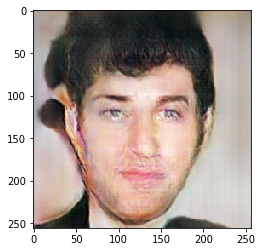

Epoch 12/100... Discriminator Loss: 0.7757... Discriminator Loss(real): 0.5753... Discriminator Loss(fake): 0.1499... Discriminator Loss(wrong): 0.0504... Generator Loss: 2.0215
['High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Smiling', 'Wearing_Hat', 'Young']


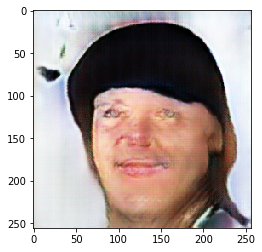

Epoch 12/100... Discriminator Loss: 1.1623... Discriminator Loss(real): 0.4781... Discriminator Loss(fake): 0.5786... Discriminator Loss(wrong): 0.1056... Generator Loss: 1.0152
['Bags_Under_Eyes', 'Bangs', 'Black_Hair', 'Male', 'No_Beard', 'Straight_Hair', 'Young']


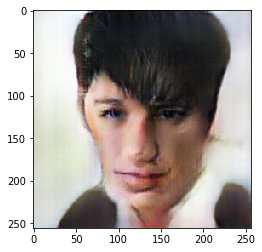

Model saved in path: /save_256_new/model.ckpt
Epoch 13/100... Discriminator Loss: 1.1150... Discriminator Loss(real): 0.4230... Discriminator Loss(fake): 0.5982... Discriminator Loss(wrong): 0.0938... Generator Loss: 0.8378
['Arched_Eyebrows', 'Big_Lips', 'Blond_Hair', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'No_Beard', 'Straight_Hair', 'Wearing_Lipstick', 'Young']


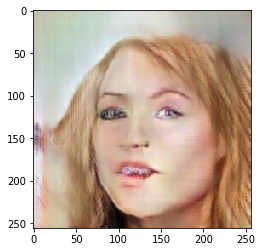

Epoch 13/100... Discriminator Loss: 0.6990... Discriminator Loss(real): 0.3483... Discriminator Loss(fake): 0.2686... Discriminator Loss(wrong): 0.0821... Generator Loss: 1.5890
['Attractive', 'Bangs', 'No_Beard', 'Wearing_Lipstick', 'Young']


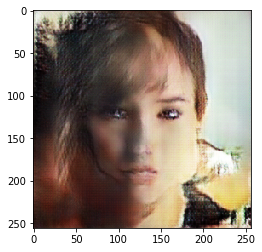

Epoch 13/100... Discriminator Loss: 0.9383... Discriminator Loss(real): 0.3933... Discriminator Loss(fake): 0.5128... Discriminator Loss(wrong): 0.0322... Generator Loss: 1.1328
['Big_Nose', 'Double_Chin', 'Eyeglasses', 'Gray_Hair', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Wavy_Hair']


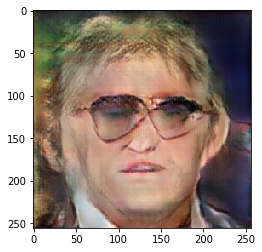

Epoch 13/100... Discriminator Loss: 0.9386... Discriminator Loss(real): 0.3867... Discriminator Loss(fake): 0.3765... Discriminator Loss(wrong): 0.1754... Generator Loss: 1.2125
['Arched_Eyebrows', 'Big_Nose', 'Black_Hair', 'Goatee', 'Male', 'Mustache', 'Sideburns', 'Wearing_Necktie', 'Young']


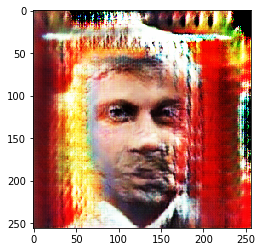

Model saved in path: /save_256_new/model.ckpt
Epoch 14/100... Discriminator Loss: 0.7141... Discriminator Loss(real): 0.5045... Discriminator Loss(fake): 0.1663... Discriminator Loss(wrong): 0.0432... Generator Loss: 1.8545
['Bags_Under_Eyes', 'Big_Nose', 'Double_Chin', 'Gray_Hair', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Receding_Hairline', 'Smiling']


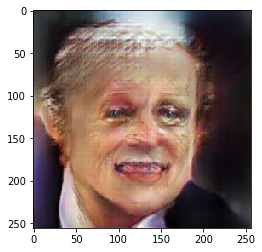

Epoch 14/100... Discriminator Loss: 0.7419... Discriminator Loss(real): 0.4948... Discriminator Loss(fake): 0.2207... Discriminator Loss(wrong): 0.0264... Generator Loss: 1.6332
['Arched_Eyebrows', 'Attractive', 'Big_Nose', 'Blond_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Smiling', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


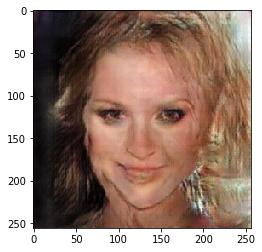

Epoch 14/100... Discriminator Loss: 0.8549... Discriminator Loss(real): 0.3709... Discriminator Loss(fake): 0.3812... Discriminator Loss(wrong): 0.1028... Generator Loss: 1.3189
['Bags_Under_Eyes', 'Big_Lips', 'Mouth_Slightly_Open', 'No_Beard', 'Pointy_Nose', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


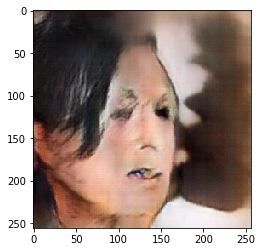

Epoch 14/100... Discriminator Loss: 0.6881... Discriminator Loss(real): 0.4258... Discriminator Loss(fake): 0.2474... Discriminator Loss(wrong): 0.0150... Generator Loss: 1.5562
['Attractive', 'Bangs', 'Big_Nose', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Smiling', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Wearing_Necklace']


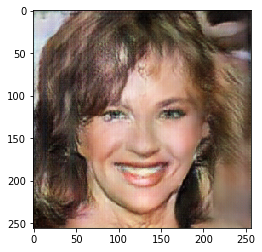

Epoch 14/100... Discriminator Loss: 0.5126... Discriminator Loss(real): 0.4100... Discriminator Loss(fake): 0.0811... Discriminator Loss(wrong): 0.0214... Generator Loss: 2.7132
['5_o_Clock_Shadow', 'Bags_Under_Eyes', 'Male', 'Young']


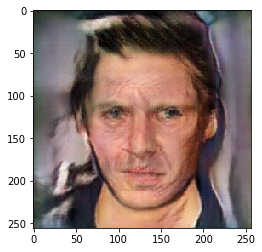

Model saved in path: /save_256_new/model.ckpt
Epoch 15/100... Discriminator Loss: 0.8132... Discriminator Loss(real): 0.3487... Discriminator Loss(fake): 0.4169... Discriminator Loss(wrong): 0.0477... Generator Loss: 1.2592
['Arched_Eyebrows', 'Big_Lips', 'Big_Nose', 'Gray_Hair', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Smiling', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick']


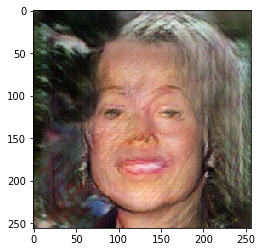

Epoch 15/100... Discriminator Loss: 1.0519... Discriminator Loss(real): 0.3515... Discriminator Loss(fake): 0.6422... Discriminator Loss(wrong): 0.0581... Generator Loss: 0.9825
['Attractive', 'Brown_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Oval_Face', 'Straight_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


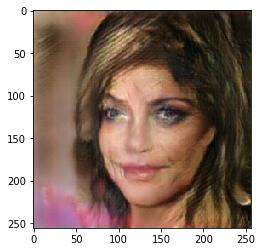

Epoch 15/100... Discriminator Loss: 0.7524... Discriminator Loss(real): 0.3446... Discriminator Loss(fake): 0.3133... Discriminator Loss(wrong): 0.0945... Generator Loss: 1.4656
['5_o_Clock_Shadow', 'Attractive', 'Brown_Hair', 'Bushy_Eyebrows', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Sideburns', 'Young']


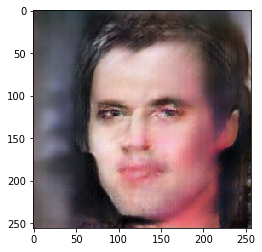

Epoch 15/100... Discriminator Loss: 0.6973... Discriminator Loss(real): 0.5281... Discriminator Loss(fake): 0.1239... Discriminator Loss(wrong): 0.0453... Generator Loss: 2.1968
['Bags_Under_Eyes', 'Big_Lips', 'Big_Nose', 'Chubby', 'No_Beard', 'Pointy_Nose', 'Smiling', 'Wearing_Hat']


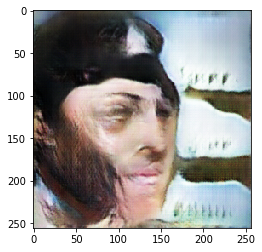

Epoch 15/100... Discriminator Loss: 0.7835... Discriminator Loss(real): 0.3754... Discriminator Loss(fake): 0.3551... Discriminator Loss(wrong): 0.0530... Generator Loss: 1.3269
['5_o_Clock_Shadow', 'Attractive', 'Bags_Under_Eyes', 'Brown_Hair', 'Male', 'Wearing_Necktie']


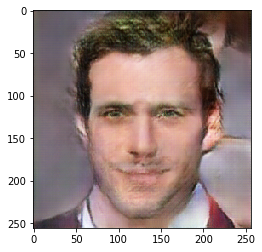

Model saved in path: /save_256_new/model.ckpt
Epoch 16/100... Discriminator Loss: 0.7283... Discriminator Loss(real): 0.4917... Discriminator Loss(fake): 0.1790... Discriminator Loss(wrong): 0.0576... Generator Loss: 1.9434
['Arched_Eyebrows', 'Bags_Under_Eyes', 'Big_Nose', 'Gray_Hair', 'Mouth_Slightly_Open', 'No_Beard', 'Wearing_Earrings']


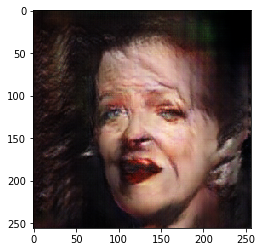

Epoch 16/100... Discriminator Loss: 0.8112... Discriminator Loss(real): 0.3456... Discriminator Loss(fake): 0.3960... Discriminator Loss(wrong): 0.0696... Generator Loss: 1.2620
['Arched_Eyebrows', 'Bags_Under_Eyes', 'Blond_Hair', 'No_Beard', 'Wavy_Hair']


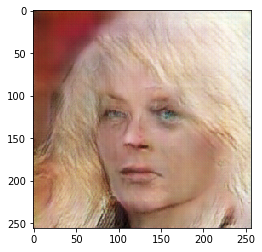

Epoch 16/100... Discriminator Loss: 0.7809... Discriminator Loss(real): 0.4191... Discriminator Loss(fake): 0.2920... Discriminator Loss(wrong): 0.0699... Generator Loss: 1.5648
['Attractive', 'Big_Lips', 'Blond_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Smiling', 'Straight_Hair', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


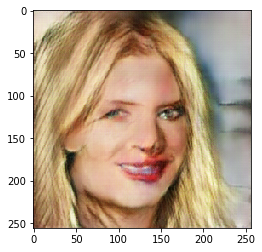

Epoch 16/100... Discriminator Loss: 1.0593... Discriminator Loss(real): 0.3458... Discriminator Loss(fake): 0.6243... Discriminator Loss(wrong): 0.0892... Generator Loss: 0.9737
['Arched_Eyebrows', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Chubby', 'Double_Chin', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Smiling', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Wearing_Necklace']


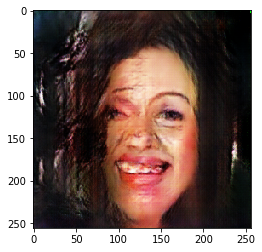

Epoch 16/100... Discriminator Loss: 0.5975... Discriminator Loss(real): 0.3859... Discriminator Loss(fake): 0.1801... Discriminator Loss(wrong): 0.0315... Generator Loss: 1.7365
['Arched_Eyebrows', 'Attractive', 'Heavy_Makeup', 'No_Beard', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Wearing_Lipstick', 'Young']


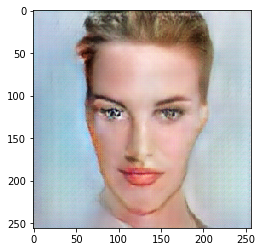

Model saved in path: /save_256_new/model.ckpt
Epoch 17/100... Discriminator Loss: 0.8476... Discriminator Loss(real): 0.3528... Discriminator Loss(fake): 0.3880... Discriminator Loss(wrong): 0.1069... Generator Loss: 1.3163
['Attractive', 'Bags_Under_Eyes', 'Bangs', 'Big_Nose', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Smiling', 'Young']


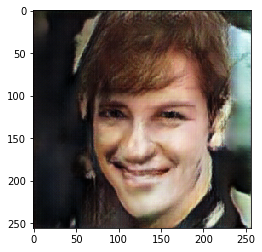

Epoch 17/100... Discriminator Loss: 0.6669... Discriminator Loss(real): 0.4976... Discriminator Loss(fake): 0.1296... Discriminator Loss(wrong): 0.0397... Generator Loss: 2.4907
['Arched_Eyebrows', 'Attractive', 'Blond_Hair', 'Male', 'Mustache', 'Pale_Skin', 'Pointy_Nose', 'Wavy_Hair', 'Young']


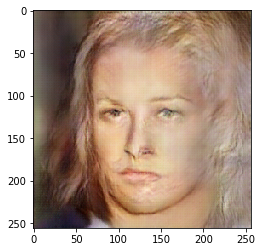

Epoch 17/100... Discriminator Loss: 0.7791... Discriminator Loss(real): 0.4436... Discriminator Loss(fake): 0.3223... Discriminator Loss(wrong): 0.0132... Generator Loss: 1.3315
['5_o_Clock_Shadow', 'Big_Lips', 'Goatee', 'Male', 'Mustache', 'Sideburns', 'Wearing_Hat', 'Wearing_Necktie', 'Young']


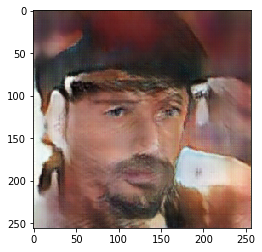

Epoch 17/100... Discriminator Loss: 0.6899... Discriminator Loss(real): 0.4593... Discriminator Loss(fake): 0.1365... Discriminator Loss(wrong): 0.0941... Generator Loss: 2.1403
['Arched_Eyebrows', 'Attractive', 'Brown_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Oval_Face', 'Rosy_Cheeks', 'Smiling', 'Wearing_Lipstick', 'Young']


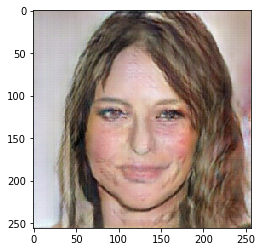

Model saved in path: /save_256_new/model.ckpt
Epoch 18/100... Discriminator Loss: 0.6404... Discriminator Loss(real): 0.3561... Discriminator Loss(fake): 0.2240... Discriminator Loss(wrong): 0.0603... Generator Loss: 1.9679
['Arched_Eyebrows', 'Attractive', 'Heavy_Makeup', 'No_Beard', 'Pointy_Nose', 'Wearing_Lipstick', 'Young']


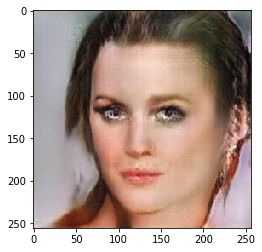

Epoch 18/100... Discriminator Loss: 1.1496... Discriminator Loss(real): 0.4220... Discriminator Loss(fake): 0.6887... Discriminator Loss(wrong): 0.0390... Generator Loss: 0.8772
['Attractive', 'Bushy_Eyebrows', 'Male', 'No_Beard', 'Pointy_Nose', 'Young']


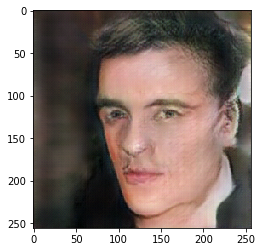

Epoch 18/100... Discriminator Loss: 0.6874... Discriminator Loss(real): 0.4044... Discriminator Loss(fake): 0.2270... Discriminator Loss(wrong): 0.0561... Generator Loss: 1.6018
['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Bags_Under_Eyes', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Bushy_Eyebrows', 'Chubby', 'Goatee', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Receding_Hairline', 'Sideburns', 'Wearing_Earrings']


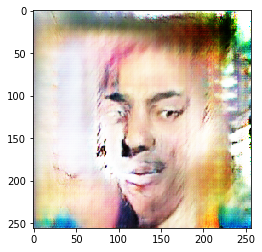

Epoch 18/100... Discriminator Loss: 1.0542... Discriminator Loss(real): 0.3580... Discriminator Loss(fake): 0.6115... Discriminator Loss(wrong): 0.0848... Generator Loss: 1.1469
['Bags_Under_Eyes', 'Bangs', 'Big_Nose', 'Bushy_Eyebrows', 'Goatee', 'Male', 'Pointy_Nose', 'Sideburns', 'Young']


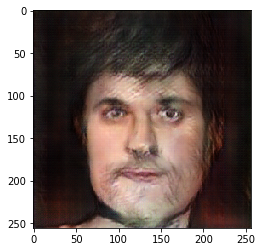

Epoch 18/100... Discriminator Loss: 0.6418... Discriminator Loss(real): 0.5515... Discriminator Loss(fake): 0.0610... Discriminator Loss(wrong): 0.0293... Generator Loss: 2.8042
['Attractive', 'Heavy_Makeup', 'No_Beard', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


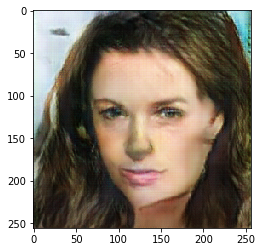

Model saved in path: /save_256_new/model.ckpt
Epoch 19/100... Discriminator Loss: 0.8032... Discriminator Loss(real): 0.5841... Discriminator Loss(fake): 0.1523... Discriminator Loss(wrong): 0.0668... Generator Loss: 2.1227
['5_o_Clock_Shadow', 'Attractive', 'Bags_Under_Eyes', 'Big_Nose', 'Goatee', 'Male', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'Pointy_Nose', 'Sideburns', 'Smiling', 'Wavy_Hair']


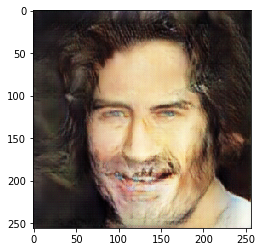

Epoch 19/100... Discriminator Loss: 0.8481... Discriminator Loss(real): 0.3448... Discriminator Loss(fake): 0.4350... Discriminator Loss(wrong): 0.0683... Generator Loss: 1.2049
['Big_Nose', 'Eyeglasses', 'Gray_Hair', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Straight_Hair']


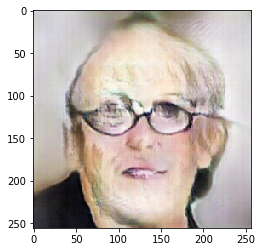

Epoch 19/100... Discriminator Loss: 0.5718... Discriminator Loss(real): 0.3890... Discriminator Loss(fake): 0.1723... Discriminator Loss(wrong): 0.0105... Generator Loss: 2.0877
['Arched_Eyebrows', 'Attractive', 'Blond_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Pointy_Nose', 'Smiling', 'Straight_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


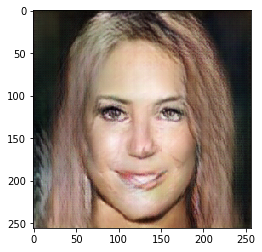

Epoch 19/100... Discriminator Loss: 0.8821... Discriminator Loss(real): 0.4604... Discriminator Loss(fake): 0.3715... Discriminator Loss(wrong): 0.0502... Generator Loss: 1.1661
['Brown_Hair', 'Eyeglasses', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Smiling', 'Wearing_Earrings']


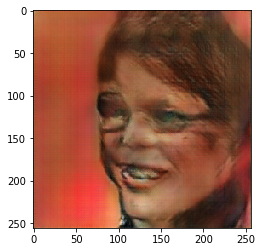

Epoch 19/100... Discriminator Loss: 0.7388... Discriminator Loss(real): 0.3467... Discriminator Loss(fake): 0.3132... Discriminator Loss(wrong): 0.0789... Generator Loss: 1.5537
['Big_Lips', 'Big_Nose', 'Bushy_Eyebrows', 'Goatee', 'High_Cheekbones', 'Male', 'Mustache', 'Narrow_Eyes', 'Oval_Face', 'Young']


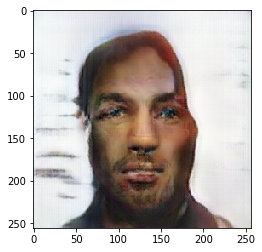

Model saved in path: /save_256_new/model.ckpt
Epoch 20/100... Discriminator Loss: 0.5786... Discriminator Loss(real): 0.3741... Discriminator Loss(fake): 0.1894... Discriminator Loss(wrong): 0.0151... Generator Loss: 2.3153
['Bangs', 'Big_Nose', 'Black_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Rosy_Cheeks', 'Smiling', 'Straight_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Wearing_Necklace']


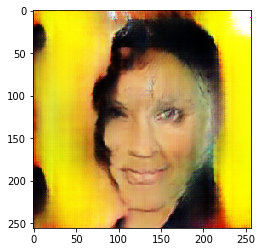

Epoch 20/100... Discriminator Loss: 0.7606... Discriminator Loss(real): 0.3496... Discriminator Loss(fake): 0.3224... Discriminator Loss(wrong): 0.0887... Generator Loss: 1.5165
['5_o_Clock_Shadow', 'Bags_Under_Eyes', 'Big_Nose', 'Black_Hair', 'Bushy_Eyebrows', 'Male', 'No_Beard', 'Oval_Face', 'Young']


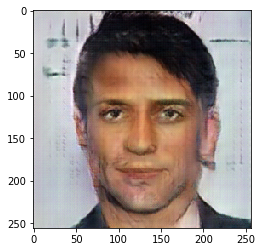

Epoch 20/100... Discriminator Loss: 0.5064... Discriminator Loss(real): 0.4026... Discriminator Loss(fake): 0.0991... Discriminator Loss(wrong): 0.0047... Generator Loss: 2.2840
['5_o_Clock_Shadow', 'Attractive', 'Big_Nose', 'Black_Hair', 'Bushy_Eyebrows', 'Male', 'Mustache', 'Sideburns', 'Straight_Hair', 'Young']


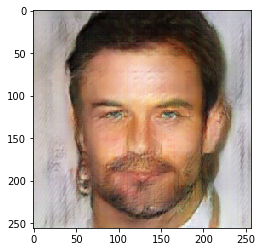

Epoch 20/100... Discriminator Loss: 0.6019... Discriminator Loss(real): 0.3876... Discriminator Loss(fake): 0.1481... Discriminator Loss(wrong): 0.0662... Generator Loss: 2.7502
['5_o_Clock_Shadow', 'Attractive', 'Black_Hair', 'Bushy_Eyebrows', 'Male', 'No_Beard', 'Straight_Hair', 'Wearing_Necktie', 'Young']


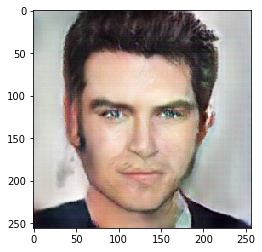

Model saved in path: /save_256_new/model.ckpt
Epoch 21/100... Discriminator Loss: 0.5786... Discriminator Loss(real): 0.3556... Discriminator Loss(fake): 0.1961... Discriminator Loss(wrong): 0.0269... Generator Loss: 2.0034
['Bags_Under_Eyes', 'Bangs', 'Big_Nose', 'Brown_Hair', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Young']


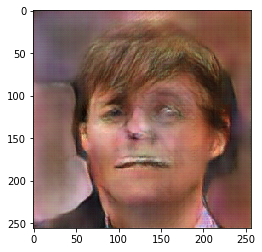

Epoch 21/100... Discriminator Loss: 0.5783... Discriminator Loss(real): 0.4003... Discriminator Loss(fake): 0.1527... Discriminator Loss(wrong): 0.0253... Generator Loss: 2.2000
['5_o_Clock_Shadow', 'Black_Hair', 'Bushy_Eyebrows', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Smiling', 'Wavy_Hair', 'Young']


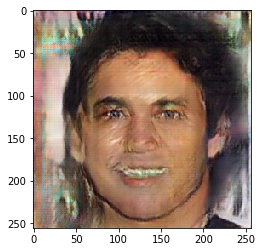

Epoch 21/100... Discriminator Loss: 0.8069... Discriminator Loss(real): 0.3739... Discriminator Loss(fake): 0.4132... Discriminator Loss(wrong): 0.0198... Generator Loss: 1.6293
['5_o_Clock_Shadow', 'Attractive', 'Brown_Hair', 'Male', 'Mouth_Slightly_Open', 'Pointy_Nose', 'Smiling', 'Young']


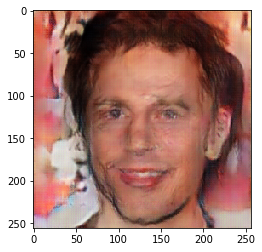

Epoch 21/100... Discriminator Loss: 0.5362... Discriminator Loss(real): 0.4054... Discriminator Loss(fake): 0.0860... Discriminator Loss(wrong): 0.0448... Generator Loss: 2.8321
['Arched_Eyebrows', 'Attractive', 'Heavy_Makeup', 'No_Beard', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


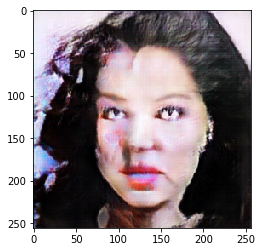

Epoch 21/100... Discriminator Loss: 0.7075... Discriminator Loss(real): 0.6381... Discriminator Loss(fake): 0.0366... Discriminator Loss(wrong): 0.0327... Generator Loss: 3.2899
['Arched_Eyebrows', 'Attractive', 'Brown_Hair', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Pointy_Nose', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


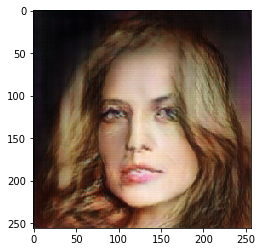

Model saved in path: /save_256_new/model.ckpt
Epoch 22/100... Discriminator Loss: 0.4829... Discriminator Loss(real): 0.3579... Discriminator Loss(fake): 0.1212... Discriminator Loss(wrong): 0.0038... Generator Loss: 2.4893
['Bangs', 'Big_Nose', 'Chubby', 'Double_Chin', 'Eyeglasses', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Smiling', 'Wearing_Lipstick', 'Wearing_Necklace']


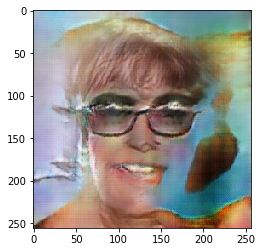

Epoch 22/100... Discriminator Loss: 0.6547... Discriminator Loss(real): 0.3536... Discriminator Loss(fake): 0.2781... Discriminator Loss(wrong): 0.0231... Generator Loss: 1.8538
['Arched_Eyebrows', 'Attractive', 'Brown_Hair', 'Heavy_Makeup', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


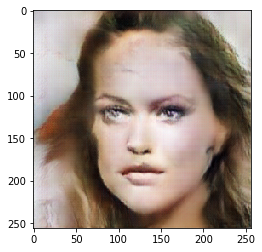

Epoch 22/100... Discriminator Loss: 0.6360... Discriminator Loss(real): 0.3743... Discriminator Loss(fake): 0.2107... Discriminator Loss(wrong): 0.0510... Generator Loss: 1.7522
['5_o_Clock_Shadow', 'Attractive', 'Bags_Under_Eyes', 'Big_Nose', 'Black_Hair', 'Bushy_Eyebrows', 'Male', 'Smiling', 'Straight_Hair', 'Wearing_Necktie', 'Young']


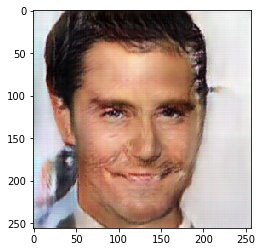

Epoch 22/100... Discriminator Loss: 0.5117... Discriminator Loss(real): 0.4327... Discriminator Loss(fake): 0.0658... Discriminator Loss(wrong): 0.0132... Generator Loss: 2.8656
['Attractive', 'Big_Lips', 'Blond_Hair', 'Heavy_Makeup', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


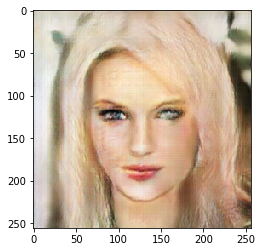

Epoch 22/100... Discriminator Loss: 1.7213... Discriminator Loss(real): 0.3834... Discriminator Loss(fake): 1.2484... Discriminator Loss(wrong): 0.0895... Generator Loss: 0.5597
['5_o_Clock_Shadow', 'Attractive', 'Bushy_Eyebrows', 'Male', 'No_Beard', 'Oval_Face', 'Straight_Hair', 'Young']


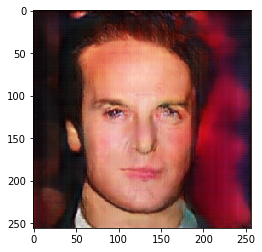

Model saved in path: /save_256_new/model.ckpt
Epoch 23/100... Discriminator Loss: 0.6136... Discriminator Loss(real): 0.3476... Discriminator Loss(fake): 0.2273... Discriminator Loss(wrong): 0.0387... Generator Loss: 1.9067
['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Black_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Oval_Face', 'Smiling', 'Straight_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


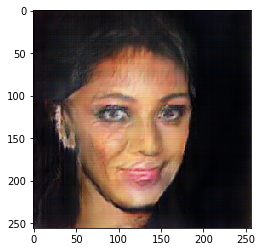

Epoch 23/100... Discriminator Loss: 0.5909... Discriminator Loss(real): 0.3564... Discriminator Loss(fake): 0.2090... Discriminator Loss(wrong): 0.0255... Generator Loss: 1.9782
['Attractive', 'Blond_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Pointy_Nose', 'Rosy_Cheeks', 'Smiling', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


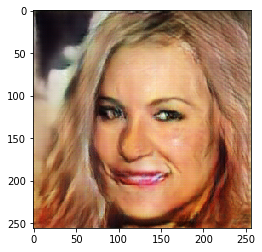

Epoch 23/100... Discriminator Loss: 0.6773... Discriminator Loss(real): 0.3708... Discriminator Loss(fake): 0.2643... Discriminator Loss(wrong): 0.0422... Generator Loss: 1.8722
['Attractive', 'Blond_Hair', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'No_Beard', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


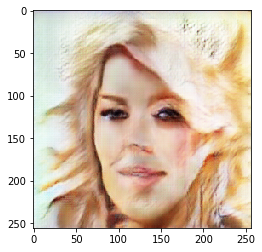

Epoch 23/100... Discriminator Loss: 0.7675... Discriminator Loss(real): 0.3774... Discriminator Loss(fake): 0.3480... Discriminator Loss(wrong): 0.0421... Generator Loss: 1.2847
['5_o_Clock_Shadow', 'Attractive', 'Big_Lips', 'Big_Nose', 'Bushy_Eyebrows', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Smiling', 'Young']


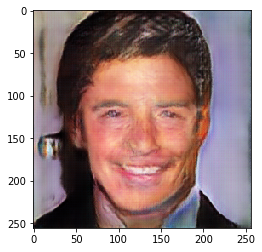

Model saved in path: /save_256_new/model.ckpt
Epoch 24/100... Discriminator Loss: 0.7264... Discriminator Loss(real): 0.3709... Discriminator Loss(fake): 0.3277... Discriminator Loss(wrong): 0.0278... Generator Loss: 1.4864
['Bags_Under_Eyes', 'Big_Nose', 'Chubby', 'Double_Chin', 'Gray_Hair', 'High_Cheekbones', 'Male', 'Mustache', 'Narrow_Eyes', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Smiling', 'Wearing_Necktie']


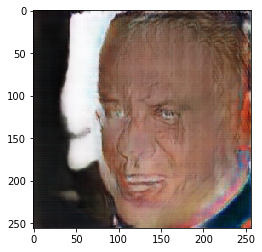

Epoch 24/100... Discriminator Loss: 1.0393... Discriminator Loss(real): 0.3588... Discriminator Loss(fake): 0.5161... Discriminator Loss(wrong): 0.1643... Generator Loss: 1.1199
['Big_Nose', 'Chubby', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Receding_Hairline', 'Smiling', 'Wearing_Lipstick']


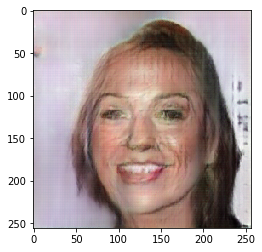

Epoch 24/100... Discriminator Loss: 0.7189... Discriminator Loss(real): 0.3660... Discriminator Loss(fake): 0.3262... Discriminator Loss(wrong): 0.0267... Generator Loss: 1.5643
['Bags_Under_Eyes', 'Eyeglasses', 'Male', 'Mouth_Slightly_Open', 'No_Beard', 'Straight_Hair', 'Young']


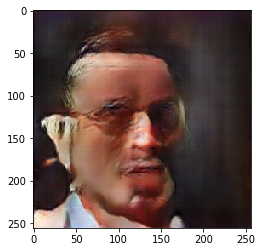

Epoch 24/100... Discriminator Loss: 0.6081... Discriminator Loss(real): 0.3858... Discriminator Loss(fake): 0.1808... Discriminator Loss(wrong): 0.0415... Generator Loss: 1.9719
['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Black_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Pointy_Nose', 'Smiling', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


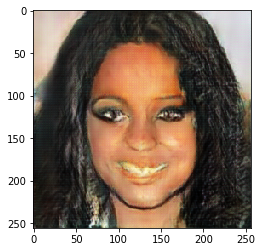

Epoch 24/100... Discriminator Loss: 0.6857... Discriminator Loss(real): 0.3612... Discriminator Loss(fake): 0.2961... Discriminator Loss(wrong): 0.0284... Generator Loss: 1.7436
['Arched_Eyebrows', 'Attractive', 'Blond_Hair', 'Heavy_Makeup', 'No_Beard', 'Wearing_Earrings', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


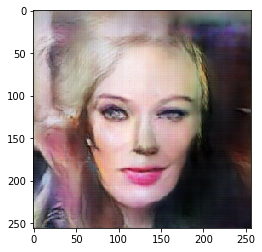

Model saved in path: /save_256_new/model.ckpt
Epoch 25/100... Discriminator Loss: 0.5859... Discriminator Loss(real): 0.3501... Discriminator Loss(fake): 0.2167... Discriminator Loss(wrong): 0.0191... Generator Loss: 1.7626
['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Black_Hair', 'Heavy_Makeup', 'Mouth_Slightly_Open', 'No_Beard', 'Smiling', 'Wearing_Lipstick', 'Young']


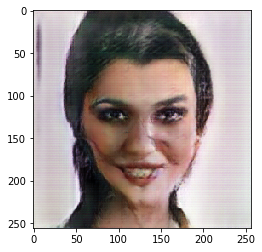

Epoch 25/100... Discriminator Loss: 0.5849... Discriminator Loss(real): 0.3390... Discriminator Loss(fake): 0.2405... Discriminator Loss(wrong): 0.0053... Generator Loss: 1.6950
['Arched_Eyebrows', 'Blond_Hair', 'No_Beard', 'Oval_Face', 'Pointy_Nose', 'Straight_Hair', 'Wearing_Lipstick', 'Young']


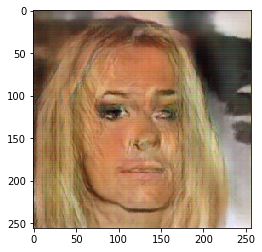

Epoch 25/100... Discriminator Loss: 0.6301... Discriminator Loss(real): 0.3544... Discriminator Loss(fake): 0.2301... Discriminator Loss(wrong): 0.0457... Generator Loss: 1.7962
['Attractive', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Rosy_Cheeks', 'Smiling', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


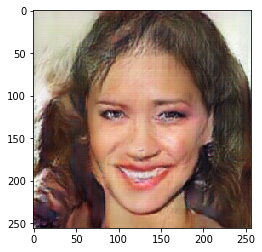

Epoch 25/100... Discriminator Loss: 0.5471... Discriminator Loss(real): 0.3773... Discriminator Loss(fake): 0.1566... Discriminator Loss(wrong): 0.0131... Generator Loss: 1.8934
['Arched_Eyebrows', 'Bushy_Eyebrows', 'Heavy_Makeup', 'No_Beard', 'Oval_Face', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


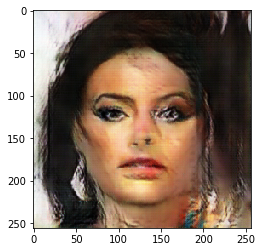

Epoch 25/100... Discriminator Loss: 0.5122... Discriminator Loss(real): 0.3595... Discriminator Loss(fake): 0.1277... Discriminator Loss(wrong): 0.0249... Generator Loss: 2.4681
['5_o_Clock_Shadow', 'Attractive', 'Big_Nose', 'Bushy_Eyebrows', 'Male', 'Mustache', 'Sideburns', 'Young']


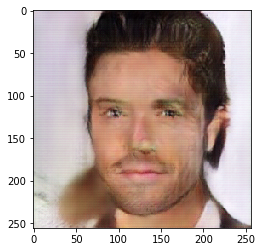

Model saved in path: /save_256_new/model.ckpt


KeyboardInterrupt: 

In [12]:
batch_size = 16
learning_rate = 0.0002
beta1 = 0.5
epochs = 100
z_dim=100


with tf.Graph().as_default():
    train(epochs, batch_size, learning_rate, beta1, get_batches, shape_high,z_dim)